# Explanatory Data Analysis Notebook

## 1. Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## 2. Load Data and Preprocessing

In [2]:
# Define data path
DATA_PATH = "./data"
GAME_DATA = DATA_PATH + "/games.csv"

In [3]:
# Load and check data
df = pd.read_csv(GAME_DATA)
df.head()

,AppID,Name,Release date,Estimated owners,Peak CCU,Required age,Price,DLC count,About the game,Supported languages,...,Average playtime two weeks,Median playtime forever,Median playtime two weeks,Developers,Publishers,Categories,Genres,Tags,Screenshots,Movies
0,20200,Galactic Bowling,"Oct 21, 2008",0 - 20000,0,0,19.99,0,Galactic Bowling is an exaggerated and stylize...,['English'],...,0,0,0,Perpetual FX Creative,Perpetual FX Creative,"Single-player,Multi-player,Steam Achievements,...","Casual,Indie,Sports","Indie,Casual,Sports,Bowling",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
1,655370,Train Bandit,"Oct 12, 2017",0 - 20000,0,0,0.99,0,THE LAW!! Looks to be a showdown atop a train....,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,0,Rusty Moyher,Wild Rooster,"Single-player,Steam Achievements,Full controll...","Action,Indie","Indie,Action,Pixel Graphics,2D,Retro,Arcade,Sc...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
2,1732930,Jolt Project,"Nov 17, 2021",0 - 20000,0,0,4.99,0,Jolt Project: The army now has a new robotics ...,"['English', 'Portuguese - Brazil']",...,0,0,0,Campião Games,Campião Games,Single-player,"Action,Adventure,Indie,Strategy",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
3,1355720,Henosis™,"Jul 23, 2020",0 - 20000,0,0,5.99,0,HENOSIS™ is a mysterious 2D Platform Puzzler w...,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,0,Odd Critter Games,Odd Critter Games,"Single-player,Full controller support","Adventure,Casual,Indie","2D Platformer,Atmospheric,Surreal,Mystery,Puzz...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
4,1139950,Two Weeks in Painland,"Feb 3, 2020",0 - 20000,0,0,0.00,0,ABOUT THE GAME Play as a hacker who has arrang...,"['English', 'Spanish - Spain']",...,0,0,0,Unusual Games,Unusual Games,"Single-player,Steam Achievements","Adventure,Indie","Indie,Adventure,Nudity,Violent,Sexual Content,...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...


### 2.1. Rename columns

In [4]:
# List all columns
df.columns

Index(['AppID', 'Name', 'Release date', 'Estimated owners', 'Peak CCU',
       'Required age', 'Price', 'DLC count', 'About the game',
       'Supported languages', 'Full audio languages', 'Reviews',
       'Header image', 'Website', 'Support url', 'Support email', 'Windows',
       'Mac', 'Linux', 'Metacritic score', 'Metacritic url', 'User score',
       'Positive', 'Negative', 'Score rank', 'Achievements', 'Recommendations',
       'Notes', 'Average playtime forever', 'Average playtime two weeks',
       'Median playtime forever', 'Median playtime two weeks', 'Developers',
       'Publishers', 'Categories', 'Genres', 'Tags', 'Screenshots', 'Movies'],
      dtype='object')

In [5]:
og_cols = df.columns
col_mapping = dict(zip(og_cols, ["_".join(col.lower().split()) for col in og_cols]))
df = df.rename(columns=col_mapping)
df

,appid,name,release_date,estimated_owners,peak_ccu,required_age,price,dlc_count,about_the_game,supported_languages,...,average_playtime_two_weeks,median_playtime_forever,median_playtime_two_weeks,developers,publishers,categories,genres,tags,screenshots,movies
0,20200,Galactic Bowling,"Oct 21, 2008",0 - 20000,0,0,19.99,0,Galactic Bowling is an exaggerated and stylize...,['English'],...,0,0,0,Perpetual FX Creative,Perpetual FX Creative,"Single-player,Multi-player,Steam Achievements,...","Casual,Indie,Sports","Indie,Casual,Sports,Bowling",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
1,655370,Train Bandit,"Oct 12, 2017",0 - 20000,0,0,0.99,0,THE LAW!! Looks to be a showdown atop a train....,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,0,Rusty Moyher,Wild Rooster,"Single-player,Steam Achievements,Full controll...","Action,Indie","Indie,Action,Pixel Graphics,2D,Retro,Arcade,Sc...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
2,1732930,Jolt Project,"Nov 17, 2021",0 - 20000,0,0,4.99,0,Jolt Project: The army now has a new robotics ...,"['English', 'Portuguese - Brazil']",...,0,0,0,Campião Games,Campião Games,Single-player,"Action,Adventure,Indie,Strategy",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
3,1355720,Henosis™,"Jul 23, 2020",0 - 20000,0,0,5.99,0,HENOSIS™ is a mysterious 2D Platform Puzzler w...,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,0,Odd Critter Games,Odd Critter Games,"Single-player,Full controller support","Adventure,Casual,Indie","2D Platformer,Atmospheric,Surreal,Mystery,Puzz...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
4,1139950,Two Weeks in Painland,"Feb 3, 2020",0 - 20000,0,0,0.00,0,ABOUT THE GAME Play as a hacker who has arrang...,"['English', 'Spanish - Spain']",...,0,0,0,Unusual Games,Unusual Games,"Single-player,Steam Achievements","Adventure,Indie","Indie,Adventure,Nudity,Violent,Sexual Content,...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85098,2669080,Mannerheim's Saloon Car,"Jan 2, 2024",0 - 0,0,0,0.00,0,Marshal Mannerheim’s Saloon Car is the train c...,"['English', 'Finnish']",...,0,0,0,Xamk Game Studios,"Sodan ja rauhan keskus Muisti, Päämajamuseo","Single-player,Tracked Controller Support,VR Only","Adventure,Simulation",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
85099,2736910,Beer Run,"Jan 3, 2024",0 - 0,0,0,0.00,0,Beer Run is an Indie game created to steal bee...,['English'],...,0,0,0,955 Games,955 Games,Single-player,"Casual,Indie",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
85100,2743220,My Friend The Spider,"Jan 4, 2024",0 - 0,0,0,0.00,0,A small 'horror' narrative game about isolatio...,['English'],...,0,0,0,MCA,MCA,Single-player,"Adventure,Simulation",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
85101,2293130,Path of Survivors,"Jan 8, 2024",0 - 0,0,0,3.99,0,Path of Survivors is a multi-class auto-battle...,['English'],...,0,0,0,Limited Input,Limited Input,"Single-player,Steam Achievements,Partial Contr...","Action,Casual,Indie,RPG,Simulation",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...


### 2.2. Check info

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85103 entries, 0 to 85102
Data columns (total 39 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   appid                       85103 non-null  int64  
 1   name                        85097 non-null  object 
 2   release_date                85103 non-null  object 
 3   estimated_owners            85103 non-null  object 
 4   peak_ccu                    85103 non-null  int64  
 5   required_age                85103 non-null  int64  
 6   price                       85103 non-null  float64
 7   dlc_count                   85103 non-null  int64  
 8   about_the_game              81536 non-null  object 
 9   supported_languages         85103 non-null  object 
 10  full_audio_languages        85103 non-null  object 
 11  reviews                     9743 non-null   object 
 12  header_image                85103 non-null  object 
 13  website                     394

In [7]:
df.describe()

,appid,peak_ccu,required_age,price,dlc_count,metacritic_score,user_score,positive,negative,score_rank,achievements,recommendations,average_playtime_forever,average_playtime_two_weeks,median_playtime_forever,median_playtime_two_weeks
count,8.510300e+04,85103.000000,85103.000000,85103.000000,85103.000000,85103.000000,85103.000000,8.510300e+04,85103.000000,44.000000,85103.000000,8.510300e+04,85103.000000,85103.000000,85103.000000,85103.000000
mean,1.355681e+06,134.872930,0.312774,7.193703,0.543412,3.348366,0.039822,9.585609e+02,159.772570,98.909091,19.859394,7.755176e+02,104.729681,10.680105,93.316029,11.467328
std,6.949952e+05,5403.548851,2.254721,12.362478,13.721223,15.421471,1.791013,2.435920e+04,4574.583903,0.857747,171.446874,1.789338e+04,1142.447517,188.840006,1510.732101,205.372944
min,1.000000e+01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,97.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,7.723900e+05,0.000000,0.000000,0.990000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,98.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
50%,1.331540e+06,0.000000,0.000000,4.490000,0.000000,0.000000,0.000000,7.000000e+00,2.000000,99.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
75%,1.918415e+06,1.000000,0.000000,9.990000,0.000000,0.000000,0.000000,4.500000e+01,14.000000,100.000000,18.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
max,2.765800e+06,872138.000000,21.000000,999.980000,2366.000000,97.000000,100.000000,5.764420e+06,895978.000000,100.000000,9821.000000,3.441592e+06,145727.000000,19159.000000,208473.000000,19159.000000


From `df.info()`, we decide to remove rows where name is `NaN`, since we cannot identify the name of it.

In [8]:
# Drop NaN name
df = df.dropna(subset=["name"])

## 3. Data Analysis

In [9]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

### 3.1. Price range

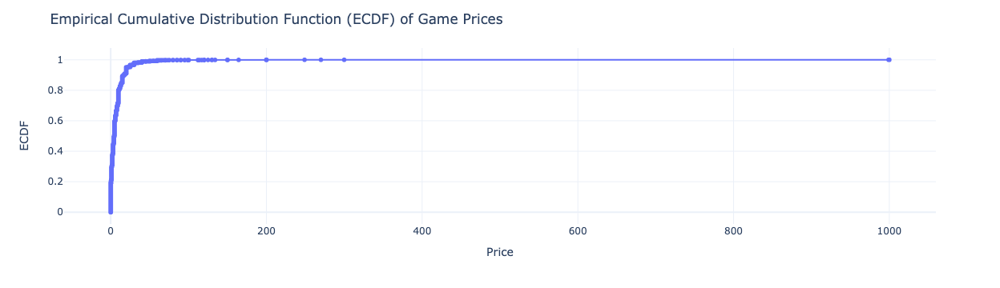

In [10]:
prices_sorted = df['price'].sort_values()

# Calculate ECDF
ecdf = pd.Series(range(1, len(prices_sorted) + 1), index=prices_sorted) / len(prices_sorted)

# Plot ECDF using Plotly
price_plot_data = pd.DataFrame({'Price': ecdf.index, 'ECDF': ecdf.values})
fig = px.line(price_plot_data, x="Price", y="ECDF", markers=True, hover_data={'Price': ':.2f', 'ECDF': ':.2f'})
fig.update_layout(
    title="Empirical Cumulative Distribution Function (ECDF) of Game Prices",
    xaxis_title="Price",
    yaxis_title="ECDF",
    template='plotly_white'
)
fig.show()

### 3.2. Game Genres

In [12]:
# Expand genres column + group by genre and count
genre_df = df.assign(genres=df["genres"].str.split(',')).explode("genres")
genre_counts = genre_df.groupby(["name", "genres"]).size().reset_index(name="count")

#  Aggregate counts and sort
genre_counts_aggregated = genre_counts.groupby('genres')['count'].sum().reset_index(name='total_count')
sorted_genres = genre_counts_aggregated.sort_values(by='total_count', ascending=False)
top_10_genres = sorted_genres.head(10)

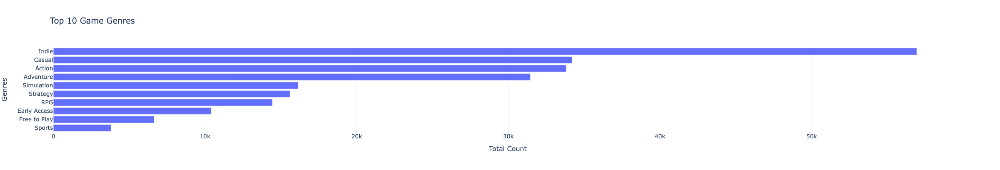

In [17]:
top_10_genres = top_10_genres[::-1] # Reverse the list for visualization
fig = go.Figure(go.Bar(
    x=top_10_genres['total_count'],
    y=top_10_genres['genres'],
    orientation='h'
))

fig.update_layout(
    title='Top 10 Game Genres',
    xaxis_title='Total Count',
    yaxis_title='Genres',
    template='plotly_white'
)

fig.show()

### 3.3. Playtime

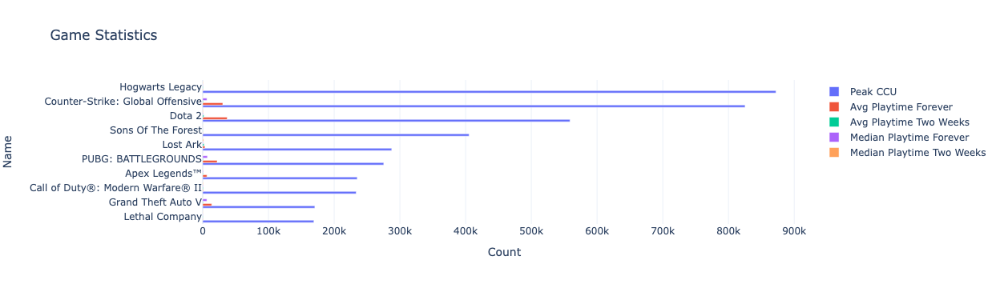

In [57]:
sorted_ccu = df.copy().sort_values(by="peak_ccu", ascending=False).head(10)[::-1]

fig = go.Figure(data=[
    go.Bar(name='Peak CCU', y=sorted_ccu["name"], x=sorted_ccu["peak_ccu"], orientation='h'),
    go.Bar(name='Avg Playtime Forever', y=sorted_ccu["name"], x=sorted_ccu["average_playtime_forever"], orientation='h'),
    go.Bar(name='Avg Playtime Two Weeks', y=sorted_ccu["name"], x=sorted_ccu["average_playtime_two_weeks"], orientation='h'),
    go.Bar(name='Median Playtime Forever', y=sorted_ccu["name"], x=sorted_ccu["median_playtime_forever"], orientation='h'),
    go.Bar(name='Median Playtime Two Weeks', y=sorted_ccu["name"], x=sorted_ccu["median_playtime_two_weeks"], orientation='h')
])

# Update the layout
fig.update_layout(
    title='Game Statistics',
    xaxis_title='Count',
    yaxis_title='Name',
    barmode='group',
    template='plotly_white'
)

# Show the plot
fig.show()

### 3.4. Rating

In [35]:
# Positive rating
sorted_pos_df = df.copy().sort_values(by='positive', ascending=False).head(10)[::-1]

# Negative rating
sorted_neg_df = df.copy().sort_values(by="negative", ascending=False).head(10)[::-1]

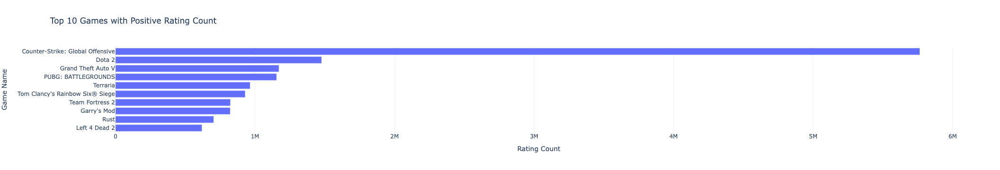

In [48]:
fig = go.Figure(go.Bar(
    x=sorted_pos_df['positive'],
    y=sorted_pos_df['name'],
    orientation='h'
))

fig.update_layout(
    title='Top 10 Games with Positive Rating Count',
    xaxis_title='Rating Count',
    yaxis_title='Game Name',
    template='plotly_white'
)

fig.show()

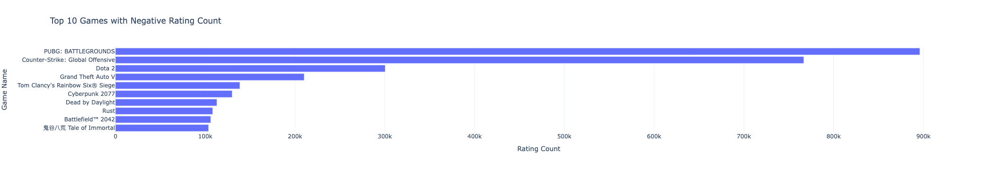

In [47]:
fig = go.Figure(go.Bar(
    x=sorted_neg_df['negative'],
    y=sorted_neg_df['name'],
    orientation='h'
))

fig.update_layout(
    title='Top 10 Games with Negative Rating Count',
    xaxis_title='Rating Count',
    yaxis_title='Game Name',
    template='plotly_white'
)

fig.show()

Interestingly, out of 20 games, 10 with highest positive rating and 10 with highest negative rating, 6 of them appear on both list. Let's graph it out and see that rate.

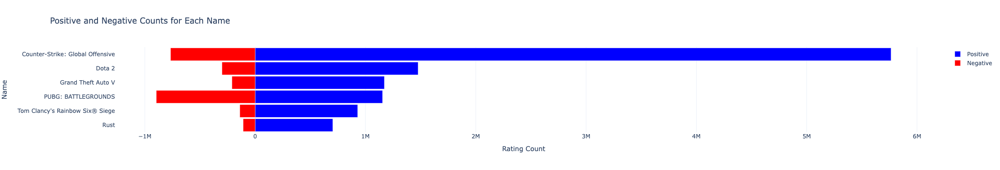

In [49]:
# Merge 2 df
merged_pos_neg_df = pd.merge(sorted_pos_df, sorted_neg_df, on=["name", "positive", "negative"], suffixes=('_df1', '_df2'))

fig = go.Figure()

fig.add_trace(go.Bar(
    y=merged_pos_neg_df['name'],
    x=merged_pos_neg_df['positive'],
    orientation='h',
    name='Positive',
    marker_color='blue'
))

fig.add_trace(go.Bar(
    y=merged_pos_neg_df['name'],
    x=merged_pos_neg_df['negative'] * -1,  # Negative values are plotted as negative
    orientation='h',
    name='Negative',
    marker_color='red'
))

fig.update_layout(
    title='Positive and Negative Counts for Each Name',
    xaxis_title='Rating Count',
    yaxis_title='Name',
    barmode='relative',
    template='plotly_white',
    bargap=0.1
)

fig.show()